<a href="https://colab.research.google.com/github/Yujini68/ESAA/blob/main/OB3_project2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 월간 데이콘 소설 작가 분류 AI 경진대회

https://dacon.io/competitions/official/235670/overview/description

## 1. 데이터 및 라이브러리 불러오기


In [ ]:
from google.colab import drive
drive.

mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings(action='ignore')
import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
import re
from wordcloud import WordCloud
from collections import Counter
import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import os

In [ ]:
# 파일 불러오기
train = pd.read_csv('/content/drive/MyDrive/ESAA/author/train.csv',encoding='utf-8')
test = pd.read_csv('/content/drive/MyDrive/ESAA/author/test_x.csv',encoding='utf-8')
sample_submission = pd.read_csv('/content/drive/MyDrive/ESAA/author/sample_submission.csv',encoding='utf-8')

In [ ]:
# 데이터 살펴보기
train.head()

,index,text,author
0,0,"He was almost choking. There was so much, so m...",3
1,1,"“Your sister asked for it, I suppose?”",2
2,2,"She was engaged one day as she walked, in per...",1
3,3,"The captain was in the porch, keeping himself ...",4
4,4,"“Have mercy, gentlemen!” odin flung up his han...",3


In [ ]:
test.head()

,index,text
0,0,“Not at all. I think she is one of the most ch...
1,1,"""No,"" replied he, with sudden consciousness, ""..."
2,2,As the lady had stated her intention of scream...
3,3,“And then suddenly in the silence I heard a so...
4,4,His conviction remained unchanged. So far as I...


In [ ]:
sample_submission.head()

,index,0,1,2,3,4
0,0,0,0,0,0,0
1,1,0,0,0,0,0
2,2,0,0,0,0,0
3,3,0,0,0,0,0
4,4,0,0,0,0,0


## 2. EDA

In [ ]:
train['author'].value_counts()

,count
author,
3,15063
0,13235
2,11554
4,7805
1,7222


<Axes: xlabel='count', ylabel='author'>

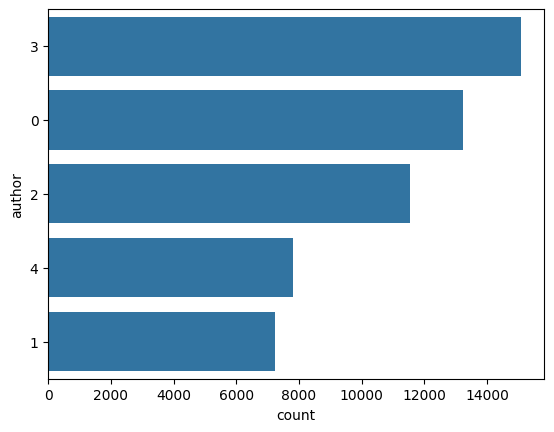

In [ ]:
# 작가 count plot bar chart
sns.countplot(y = "author", data = train, order=train['author'].value_counts().index)

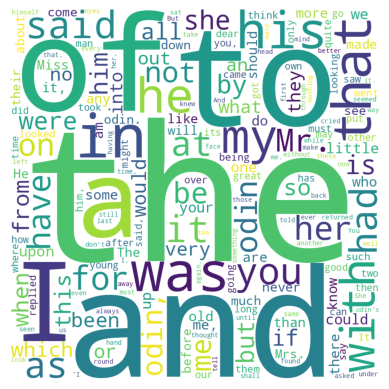

In [ ]:
# 작가 0~4까지의 text에 대한 wordcloud
wordcloud_byauthor(train, 0)

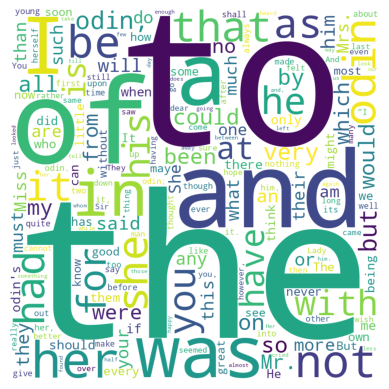

In [ ]:
wordcloud_byauthor(train, 1)

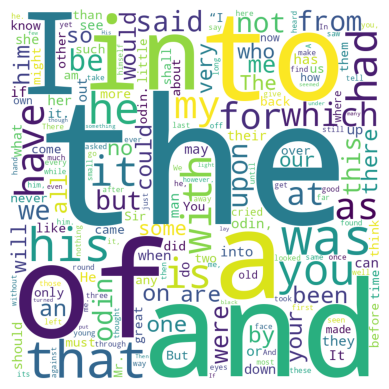

In [ ]:
wordcloud_byauthor(train, 2)

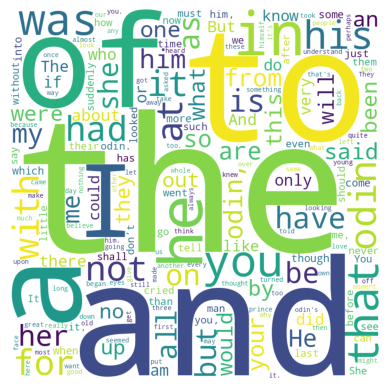

In [ ]:
wordcloud_byauthor(train, 3)

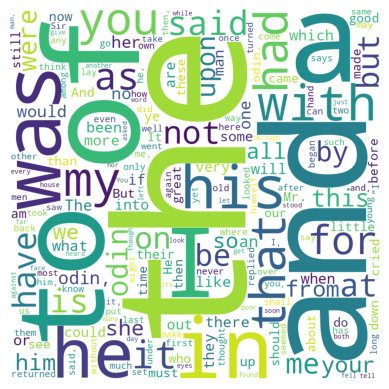

In [ ]:
wordcloud_byauthor(train, 4)

- 불용어에 해당하는 관사, 전치사 등이 다수 존재
- 작가별 사용 단어의 차이를 보기 위해선 불용어 제거 후 확인 필요

In [ ]:
# 불용어
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

stop_words_list2 = ENGLISH_STOP_WORDS
stop_words_list2

frozenset({'a',
           'about',
           'above',
           'across',
           'after',
           'afterwards',
           'again',
           'against',
           'all',
           'almost',
           'alone',
           'along',
           'already',
           'also',
           'although',
           'always',
           'am',
           'among',
           'amongst',
           'amoungst',
           'amount',
           'an',
           'and',
           'another',
           'any',
           'anyhow',
           'anyone',
           'anything',
           'anyway',
           'anywhere',
           'are',
           'around',
           'as',
           'at',
           'back',
           'be',
           'became',
           'because',
           'become',
           'becomes',
           'becoming',
           'been',
           'before',
           'beforehand',
           'behind',
           'being',
           'below',
           'beside',
           'besides'

In [ ]:
len(stop_words_list2)

318

In [ ]:
stop_words_list2 = list(stop_words_list2)

In [ ]:
stop_words_list2 = [word.lower() for word in stop_words_list2]

In [ ]:
stop_words_list2

['me',
 'for',
 'whence',
 'side',
 'into',
 'around',
 'my',
 'your',
 'against',
 'anyone',
 'else',
 'last',
 'behind',
 'hers',
 'its',
 'everywhere',
 'whereafter',
 'anyhow',
 'please',
 'latter',
 'fifty',
 'wherein',
 'any',
 'everything',
 'keep',
 'to',
 'cry',
 'across',
 'from',
 'also',
 'thence',
 'was',
 'nobody',
 'few',
 'nothing',
 'therein',
 'although',
 'during',
 'between',
 'own',
 'wherever',
 'thereupon',
 'ourselves',
 'all',
 'than',
 'towards',
 'whereby',
 'be',
 'those',
 'sometime',
 'call',
 'our',
 'herself',
 'sixty',
 'anyway',
 'otherwise',
 'us',
 'however',
 'ltd',
 'whither',
 'become',
 'her',
 'thereby',
 'top',
 'eight',
 'namely',
 'these',
 'whenever',
 'most',
 'about',
 'fifteen',
 'afterwards',
 'latterly',
 'then',
 'that',
 'through',
 'were',
 'becoming',
 'whatever',
 'former',
 'well',
 'sometimes',
 'but',
 'before',
 'rather',
 'should',
 'ten',
 'whether',
 'move',
 'out',
 'another',
 'take',
 'enough',
 'seemed',
 'him',
 'third'

In [ ]:
#워드 클라우드 시각화 함수 작성
def wordcloud_byauthor(df, author):
    text = df["text"][df["author"]==author]
    text = " ".join(text)
    text = re.sub(r'[^\w\s]', '', text).lower()
    #기존에는 wordcloud 인자로 넘겨줬으나 계속 불용어 제거가 안된 상태로 출력되기에 아예 직접 제거해버리고 생성하기로 결정
    filtered_words = [word for word in text.split() if word not in stop_words_list2]
    filtered_text = " ".join(filtered_words)

    word_counts = Counter(filtered_text.split())

    #클라우드 생성
    wordcloud = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(word_counts)
    # 워드 클라우드 시각화
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

you were not here last sunday night he said i had scant luggage to take with me to london for little of the little i possessed was adapted to my new station but i began packing that same afternoon and wildly packed up things that i knew i should want next morning in a fiction that there was not a moment to be lost why the fact is returned odin mr odin had so completely hemmed him in and was always ready with so many new points if an old one failed that he could not escape from us a most remarkable circumstance is that i really dont think he grasped this sum even so much for the gratification of his avarice which was inordinate as in the hatred he felt for odin he said so to me plainly he said he would even have spent as much to baulk or injure odin dora was delighted with the little presents and kissed me joyfully but there was a shadow between us however slight and i had made up my mind that it should not be there if there must be such a shadow anywhere i would keep it for the future 

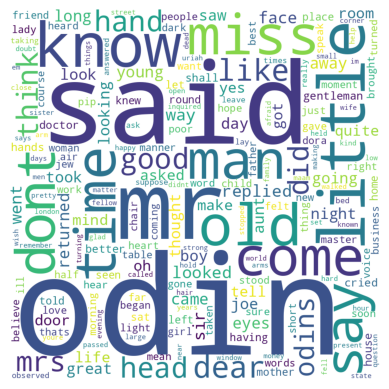

In [ ]:
wordcloud_byauthor(train, 0)

 she was engaged one day as she walked in perusing janes last letter and dwelling on some passages which proved that jane had not written in spirits when instead of being again surprised by mr odin she saw on looking up that odin was meeting her putting away the letter immediately and forcing a smile she said it suited odin best to think odin the one preferred on the very account of odin hayter whose pretensions she wished to see put an end to she looked down very decidedly upon the hayters and thought it would be quite a misfortune to have the existing connection between the families renewedvery sad for herself and her children the bustle in the vestibule as she passed along an inner lobby assured her that they were already in the house she rushed to the drawingroomshe entered itand saw only odin oh dear no said her companion from this day odin grew more comfortable she felt that she had a friend and the kindness of her cousin odin gave her better spirits with everybody else the place

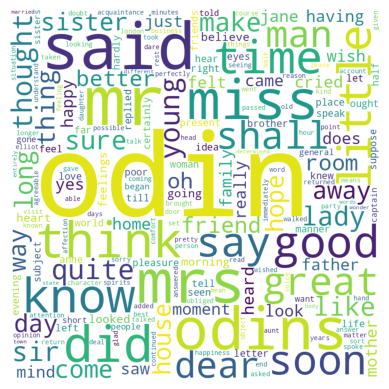

In [ ]:
wordcloud_byauthor(train, 1)

your sister asked for it i suppose a proper figure of a man atarms said the little knight why man you are no chicken yet i warrant him the stronger man see to that great stone from the coping which hath fodin upon the bridge four of my lazy varlets strove this day to carry it hence i would that you two could put them to shame by budging it though i fear that i overtask you for it is of a grievous weight  this was an unexpected piece of luck my data were coming more quickly than i could have reasonably hoped still the ticking in the hall still the breathing deeper and fuller now from the medium still the occasional flash more welcome than ever of the passing lights of the hansoms what a gap we were bridging the halfraised veil of the eternal on the one side and the cabs of london on the other the table was throbbing with a mighty pulse it swayed steadily rhythmically with an easy swooping scooping motion under our fingers sharp little raps and cracks came from its substance filefiring v

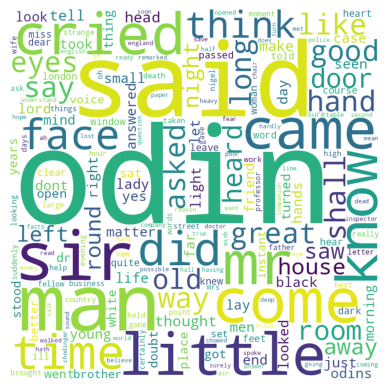

In [ ]:
wordcloud_byauthor(train, 2)

he was almost choking there was so much so much he wanted to say but strange exclamations were all that came from his lips the pole gazed fixedly at him at the bundle of notes in his hand looked at odin and was in evident perplexity have mercy gentlemen odin flung up his hands dont write that anyway have some shame here ive torn my heart asunder before you and you seize the opportunity and are fingering the wounds in both halves oh my god not to pay him was impossible considering his character but i will talk about that fellow about that plague of mine another time indeed she didnt by god i swear she didnt come back and why are you so dressed up what a curious cap youve got on i wont give up odin to you he said odin started they looked at one another i did not expect you he said hurriedly with a look that made her stop please sit down you come no doubt from odin allow menot there sit here what is it to us its not our business but yours you are doing yourself harm observed odin nervousl

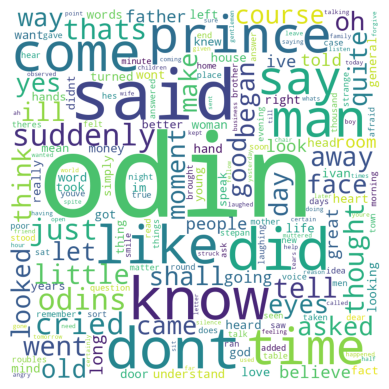

In [ ]:
wordcloud_byauthor(train, 3)

the captain was in the porch keeping himself carefully out of the way of a treacherous shot should any be intended he turned and spoke to us doctors watch on the lookout dr odin take the north side if you please jim the east gray west the watch below all hands to load muskets lively men and careful it was well fought he said and by my sooth they will not charge us twice you must not ask me that i cried hell may have noble flames i have known him a score of years and always hated and always admired and always slavishly feared him one rogue the fewer i dare say observed the master of the house have you no friends said i before he could recover i was safe out of the corner where he had me trapped with all the deck to dodge about just forward of the mainmast i stopped drew a pistol from my odin took a cool aim though he had already turned and was once more coming directly after me and drew the trigger the hammer fell but there followed neither flash nor sound the priming was useless with s

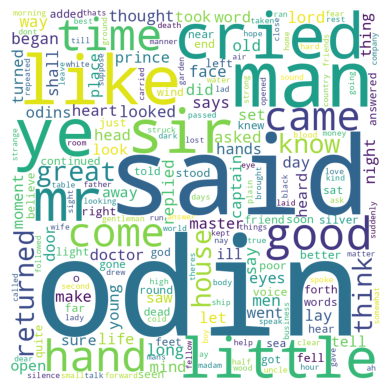

In [ ]:
wordcloud_byauthor(train, 4)

- 가장 자주 사용된 단어(odin, said 등) 외에는 약간의 차이 확인 가능
- 카운트 기반의 모델만 사용하기엔 작가별 사용 단어 빈도 차이가 명확해 보이지 않음

In [ ]:
# 전체 데이터에다가 수행하기 위해 함수 약간 변경
#워드 클라우드 시각화 함수 작성
def wordcloud_byauthor(df):
    text = df["text"]
    text = " ".join(text)
    text = re.sub(r'[^\w\s]', '', text).lower()
    #기존에는 wordcloud 인자로 넘겨줬으나 계속 불용어 제거가 안된 상태로 출력되기에 아예 직접 제거해버리고 생성하기로 결정
    filtered_words = [word for word in text.split() if word not in stop_words_list2]
    filtered_text = " ".join(filtered_words)

    word_counts = Counter(filtered_text.split())

    #클라우드 생성
    wordcloud = WordCloud(width=800, height=800, background_color='white').generate_from_frequencies(word_counts)
    # 워드 클라우드 시각화
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.show()

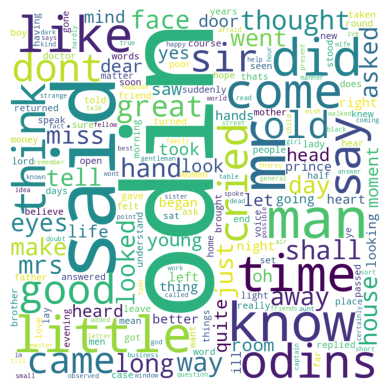

In [ ]:
wordcloud_byauthor(train)

## 3. 전처리

In [ ]:
# 부호 제거
def alpha_num(text):
    return re.sub(r'[^A-Za-z0-9]',' ',text)

train['text']=train['text'].apply(alpha_num)

In [ ]:
train.head()

,index,text,author
0,0,He was almost choking There was so much so m...,3
1,1,Your sister asked for it I suppose,2
2,2,She was engaged one day as she walked in per...,1
3,3,The captain was in the porch keeping himself ...,4
4,4,Have mercy gentlemen odin flung up his han...,3


## 4. 모델링

In [ ]:
!pip install --upgrade tensorflow==2.15.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.2/475.2 MB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 47.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 40.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 69.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 21.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.7 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: keras
    Found existing installation: keras 3.5.0
    Uninstalling keras-3.5.0:
      Successfully uninstalled keras-3.5.0
  Attempting uninstall: tensorboard
    Found existing installation

In [ ]:
# train test 분리
X_train = np.array([x for x in train['text']])
X_test = np.array([x for x in test['text']])
y_train = np.array([x for x in train['author']])

In [ ]:
# 파라미터 설정
vocab_size = 20000
embedding_dim = 16
max_length = 500
padding_type = 'post'

In [ ]:
# tokenizer에 fit
tokenizer = Tokenizer(num_words = vocab_size)
tokenizer.fit_on_texts(X_train)
word_index = tokenizer.word_index

In [ ]:
# 데이터를 sequence로 변환해주고 padding
train_sequences = tokenizer.texts_to_sequences(X_train)
train_padded = pad_sequences(train_sequences, padding=padding_type, maxlen=max_length)

test_sequences = tokenizer.texts_to_sequences(X_test)
test_padded = pad_sequences(test_sequences, padding=padding_type, maxlen=max_length)

### ML

#### TF-IDF + RF



In [ ]:
# 테스트 데이터야 제출용이기 때문에 일단 학습 데이터를 학습/검증으로 나눠 진행해보고자 함
from sklearn.model_selection import train_test_split
X = train['text']
y = train['author']
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# TF-IDF 사용
tfidf_vectorizer = TfidfVectorizer(
    ngram_range=(1, 2),  #1개짜리랑 bigram
    max_df=0.9,  #90% 이상의 문서에 등장하는 단어 무시
    min_df=100,  #100개 이상의 문서에 등장하는 단어만 사용
)
tfidf_matrix_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_matrix_val = tfidf_vectorizer.transform(X_val)
print("TF-IDF Matrix:\n", tfidf_matrix_train.toarray())

TF-IDF Matrix:
 [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
tfidf_matrix_train.shape

(43903, 3028)

In [ ]:
tfidf_matrix_val.shape

(10976, 3028)

#### XGB
- accuracy: 0.64523)

In [ ]:
import xgboost as xgb
xgb_model = xgb.XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(tfidf_matrix_train, y_train)
pred_xgb = xgb_model.predict(tfidf_matrix_val)
accuracy_score(y_val, pred_xgb)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [08:00:40] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


0.6452259475218659

<Axes: >

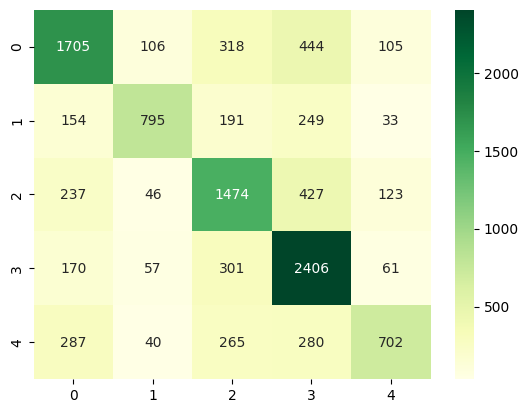

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
#오차 행렬 시각화
cm = confusion_matrix(y_val, pred_xgb)
cm_matrix = pd.DataFrame(data=cm)

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGn')

#### LGBM
- accuracy: 0.66891

In [ ]:
import lightgbm as lgb
lgb_model = lgb.LGBMClassifier(random_state=42)
lgb_model.fit(tfidf_matrix_train, y_train)
pred_lgb = lgb_model.predict(tfidf_matrix_val)
accuracy_score(y_val, pred_lgb)

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 1.180850 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 295993
[LightGBM] [Info] Number of data points in the train set: 43903, number of used features: 3028
[LightGBM] [Info] Start training from score -1.425194
[LightGBM] [Info] Start training from score -2.024125
[LightGBM] [Info] Start training from score -1.557683
[LightGBM] [Info] Start training from score -1.291425
[LightGBM] [Info] Start training from score -1.952446


0.6689139941690962

<Axes: >

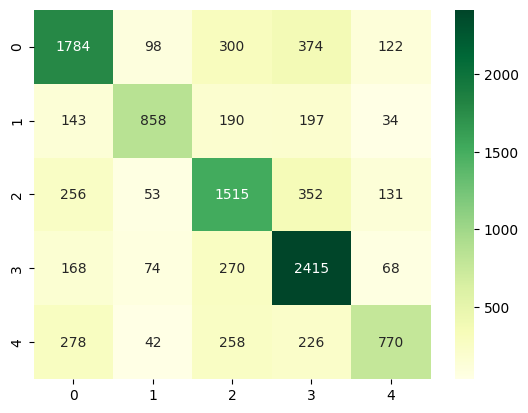

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix
#오차 행렬 시각화
cm = confusion_matrix(y_val, pred_lgb)
cm_matrix = pd.DataFrame(data=cm)

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGn')

### DL

#### 모델1

- 점수: 0.5486315084
- 드롭 아웃 비율 조정, L2 정규화 추가, 학습률 조정, 조기 종료 콜백 설정

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Embedding, Conv1D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2

# 모델 정의
model = Sequential([
    Embedding(vocab_size, embedding_dim, input_length=max_length),

    Conv1D(128, kernel_size=5, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),  # 드롭아웃 비율 조정

    Conv1D(64, kernel_size=3, activation='relu'),
    BatchNormalization(),
    Dropout(0.3),  # 드롭아웃 비율 조정

    Flatten(),
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),  # L2 정규화 추가
    Dropout(0.5),  # 드롭아웃
    Dense(5, activation='softmax')  # 다중분류
])

# 모델 컴파일
model.compile(loss='sparse_categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),  # 학습률 조정
              metrics=['accuracy'])

# 조기 종료 콜백 설정
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# 모델 요약 출력
print(model.summary())

# 모델 학습
num_epochs = 30
history = model.fit(train_padded, y_train, epochs=num_epochs, batch_size=32,
                    verbose=2, validation_split=0.2, callbacks=[early_stopping])

# 예측
pred = model.predict(test_padded)
predicted_classes = np.argmax(pred, axis=1)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 500, 16)           320000    
                                                                 
 conv1d_2 (Conv1D)           (None, 496, 128)          10368     
                                                                 
 batch_normalization_2 (Bat  (None, 496, 128)          512       
 chNormalization)                                                
                                                                 
 dropout_3 (Dropout)         (None, 496, 128)          0         
                                                                 
 conv1d_3 (Conv1D)           (None, 494, 64)           24640     
                                                                 
 batch_normalization_3 (Bat  (None, 494, 64)           256       
 chNormalization)                                     

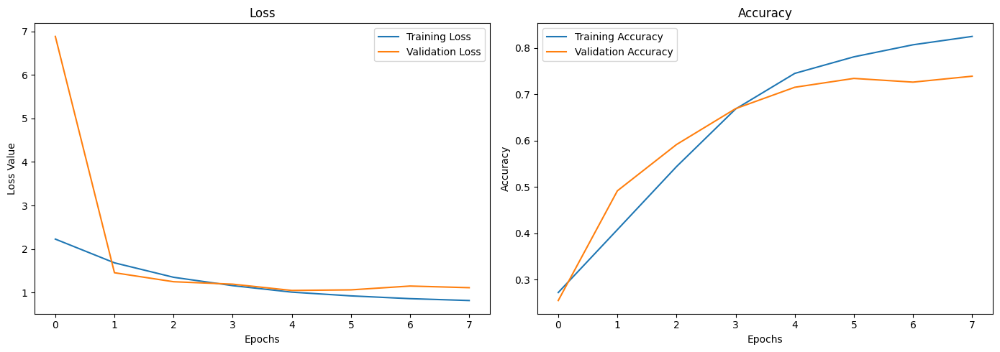

In [ ]:
import matplotlib.pyplot as plt
history_dict = history.history

# 손실 그래프
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)  # 1행 2열의 첫 번째 그래프
plt.plot(history_dict['loss'], label='Training Loss')
plt.plot(history_dict['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss Value')
plt.legend()

# 정확도 그래프
plt.subplot(1, 2, 2)  # 1행 2열의 두 번째 그래프
plt.plot(history_dict['accuracy'], label='Training Accuracy')
plt.plot(history_dict['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# 그래프 출력
plt.tight_layout()
plt.show()

In [ ]:
# submission
sample_submission[['0','1','2','3','4']] = pred
sample_submission.to_csv('/content/drive/MyDrive/24-2 ESAA/프로젝트(2)/소설작가분류/submission_m3.csv', index = False, encoding = 'utf-8')

- public: 0.5486315084
- private: 0.5725088662

#### 모델 2

- 점수: 1.2699964775
- Keras-Tuner 사용

In [ ]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 5.5 MB/s eta 0:00:00


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Embedding, Conv1D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from kerastuner.tuners import RandomSearch

def build_model(hp):
    model = Sequential()
    model.add(Embedding(vocab_size, embedding_dim, input_length=max_length))

    # 하이퍼파라미터로 필터 수와 커널 크기를 설정
    for i in range(hp.Int('num_conv_layers', 1, 3)):  # 1~3개의 Conv1D 레이어
        model.add(Conv1D(filters=hp.Int('filters_' + str(i), 32, 256, step=32),
                          kernel_size=hp.Int('kernel_size_' + str(i), 3, 7),
                          activation='relu'))
        model.add(BatchNormalization())
        model.add(Dropout(0.3))

    model.add(Flatten())
    model.add(Dense(units=hp.Int('dense_units', 32, 128, step=32), activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(5, activation='softmax'))

    model.compile(optimizer=tf.keras.optimizers.Adam(lr=hp.Float('learning_rate', 1e-4, 1e-2, sampling='LOG')),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=5,
    executions_per_trial=1,
    directory='my_dir',
    project_name='helloworld'
)

# 모델 튜닝
tuner.search(train_padded, y_train, epochs=20, validation_split=0.2)

# 최적의 모델 가져오기
best_model = tuner.get_best_models(num_models=1)[0]

Trial 5 Complete [00h 05m 24s]
val_accuracy: 0.7347849607467651

Best val_accuracy So Far: 0.7348760962486267
Total elapsed time: 00h 43m 53s


Epoch 1/20
1372/1372 - 64s - loss: 0.3517 - accuracy: 0.8770 - val_loss: 1.0972 - val_accuracy: 0.7310 - 64s/epoch - 46ms/step
Epoch 2/20
1372/1372 - 14s - loss: 0.3293 - accuracy: 0.8850 - val_loss: 0.9703 - val_accuracy: 0.7362 - 14s/epoch - 10ms/step
Epoch 3/20
1372/1372 - 13s - loss: 0.3068 - accuracy: 0.8930 - val_loss: 1.0392 - val_accuracy: 0.7323 - 13s/epoch - 10ms/step
Epoch 4/20
1372/1372 - 10s - loss: 0.2934 - accuracy: 0.8989 - val_loss: 1.2685 - val_accuracy: 0.7386 - 10s/epoch - 7ms/step
Epoch 5/20
1372/1372 - 11s - loss: 0.2835 - accuracy: 0.9023 - val_loss: 1.0541 - val_accuracy: 0.7317 - 11s/epoch - 8ms/step
Epoch 6/20
1372/1372 - 12s - loss: 0.2719 - accuracy: 0.9062 - val_loss: 1.1021 - val_accuracy: 0.7218 - 12s/epoch - 9ms/step
Epoch 7/20
1372/1372 - 10s - loss: 0.2617 - accuracy: 0.9103 - val_loss: 1.1306 - val_accuracy: 0.7241 - 10s/epoch - 7ms/step
Epoch 8/20
1372/1372 - 10s - loss: 0.2538 - accuracy: 0.9108 - val_loss: 1.0629 - val_accuracy: 0.7290 - 10s/epoch 

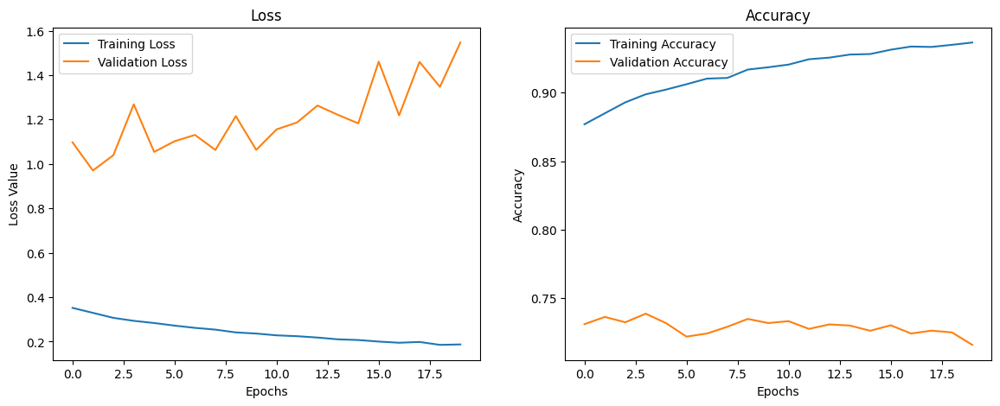

In [ ]:
# 최적 모델 훈련 (이때 history를 저장)
history = best_model.fit(train_padded, y_train, epochs=20, validation_split=0.2, verbose=2)

# 예측
pred = best_model.predict(test_padded)
predicted_classes = np.argmax(pred, axis=1)

# 손실 그래프
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss Value')
plt.legend()

# 정확도 그래프
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

In [ ]:
# submission
sample_submission[['0','1','2','3','4']] = pred
sample_submission.to_csv('/content/drive/MyDrive/24-2 ESAA/프로젝트(2)/소설작가분류/submission_m4.csv', index = False, encoding = 'utf-8')

- public: 	1.2699964775
- private: 1.20544823

#### 모델 3
- BERT


In [ ]:
import numpy as np
import pandas as pd
from transformers import BertTokenizer, TFBertForSequenceClassification
from transformers import Trainer, TrainingArguments

# 데이터 준비
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

train_texts = train['text'].tolist()  # Extract text data from 'train' DataFrame
test_texts = test['text'].tolist()

# 텍스트를 BERT 입력 형식으로 변환
train_encodings = tokenizer(train_texts, truncation=True, padding=True, max_length=512)
test_encodings = tokenizer(test_texts, truncation=True, padding=True, max_length=512)

# TensorFlow 데이터셋으로 변환
import tensorflow as tf

train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings),
    y_train
)).shuffle(1000).batch(32)

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings),
    y_test
)).batch(32)

# BERT 모델 로드
model = TFBertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=5)

# 훈련 인자 설정
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,
    per_device_train_batch_size=32,
    per_device_eval_batch_size=32,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir='./logs',
    logging_steps=10,
    evaluation_strategy="epoch"
)

# Trainer 객체 생성
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset
)

# 모델 훈련
trainer.train()

#### 모델4
- Multi-layer Dense Network (간단한 MLP)

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Flatten, Dense, Dropout

In [ ]:
model5 = Sequential([
        Embedding(vocab_size, embedding_dim, input_length=max_length),
        Flatten(),
        Dropout(0.5),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(64, activation='relu'),
        Dropout(0.5),
        Dense(5, activation='softmax')
    ])

In [ ]:
model5.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model5.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_9 (Embedding)     (None, 500, 16)           320000    
                                                                 
 flatten_2 (Flatten)         (None, 8000)              0         
                                                                 
 dropout_17 (Dropout)        (None, 8000)              0         
                                                                 
 dense_18 (Dense)            (None, 128)               1024128   
                                                                 
 dropout_18 (Dropout)        (None, 128)               0         
                                                                 
 dense_19 (Dense)            (None, 64)                8256      
                                                                 
 dropout_19 (Dropout)        (None, 64)               

In [ ]:
# 모델 학습
num_epochs = 20
history5 = model5.fit(train_padded, y_train, epochs=num_epochs, batch_size=32,
                    verbose=2, validation_split=0.2)

Epoch 1/20
1372/1372 - 35s - loss: 1.3680 - accuracy: 0.4047 - val_loss: 1.0506 - val_accuracy: 0.5783 - 35s/epoch - 25ms/step
Epoch 2/20
1372/1372 - 32s - loss: 1.0114 - accuracy: 0.5975 - val_loss: 0.8721 - val_accuracy: 0.6671 - 32s/epoch - 23ms/step
Epoch 3/20
1372/1372 - 32s - loss: 0.8451 - accuracy: 0.6793 - val_loss: 0.7765 - val_accuracy: 0.7095 - 32s/epoch - 23ms/step
Epoch 4/20
1372/1372 - 32s - loss: 0.7516 - accuracy: 0.7194 - val_loss: 0.7339 - val_accuracy: 0.7265 - 32s/epoch - 23ms/step
Epoch 5/20
1372/1372 - 32s - loss: 0.6903 - accuracy: 0.7433 - val_loss: 0.7300 - val_accuracy: 0.7266 - 32s/epoch - 23ms/step
Epoch 6/20
1372/1372 - 32s - loss: 0.6413 - accuracy: 0.7666 - val_loss: 0.7469 - val_accuracy: 0.7222 - 32s/epoch - 23ms/step
Epoch 7/20
1372/1372 - 32s - loss: 0.6102 - accuracy: 0.7764 - val_loss: 0.7245 - val_accuracy: 0.7342 - 32s/epoch - 23ms/step
Epoch 8/20
1372/1372 - 33s - loss: 0.5855 - accuracy: 0.7866 - val_loss: 0.7264 - val_accuracy: 0.7363 - 33s/ep

In [ ]:
# 예측
pred = model5.predict(test_padded)
predicted_classes = np.argmax(pred, axis=1)

predicted_classes

614/614 [==============================] - 3s 4ms/step


array([2, 0, 0, ..., 1, 1, 0])

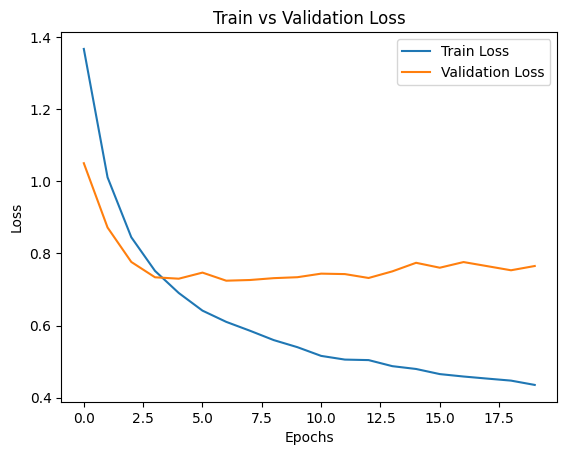

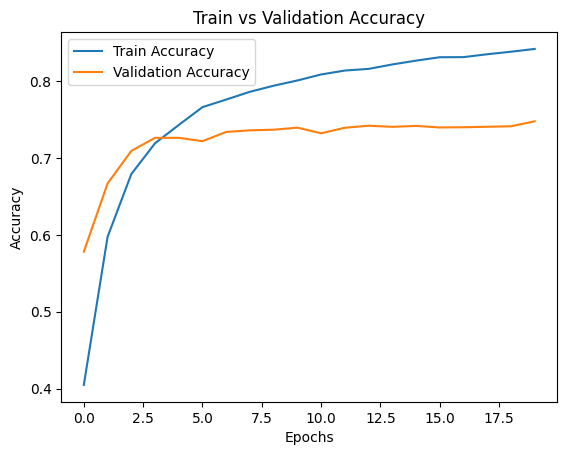

In [ ]:
import matplotlib.pyplot as plt

# 손실 그래프
plt.plot(history5.history['loss'], label='Train Loss')
plt.plot(history5.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train vs Validation Loss')
plt.show()

# 정확도 그래프
plt.plot(history5.history['accuracy'], label='Train Accuracy')
plt.plot(history5.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Train vs Validation Accuracy')
plt.show()

In [ ]:
# 제출
sample_submission[['0','1','2','3','4']] = pred
sample_submission.to_csv('/content/submission_m5.csv', index=False, encoding='utf-8')

## 점수: 0.5557612385 / 0.5778093337

#### 모델 5

- 점수: 2.193796895
- Conv1D만 사용, Dense 노드 수 감소, 학습률 감소

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.Conv1D(128, kernel_size=5, activation='relu'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dropout(0.5),  # 오버피팅 방지를 위한 드롭아웃
    tf.keras.layers.Dense(5, activation='softmax')  # 다중분류 출력
])


In [ ]:
# 모델 컴파일
model.compile(loss='sparse_categorical_crossentropy',
              optimizer = tf.keras.optimizers.Adam(learning_rate = 0.005), metrics=['accuracy'])
# 너무 왔다갔다 하길래 학습률 줄임

In [ ]:
# 모델 요약 출력
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 16)           320000    
                                                                 
 conv1d (Conv1D)             (None, 496, 128)          10368     
                                                                 
 flatten (Flatten)           (None, 63488)             0         
                                                                 
 dense (Dense)               (None, 32)                2031648   
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 5)                 165       
                                                                 
Total params: 2362181 (9.01 MB)
Trainable params: 236218

In [ ]:
# 모델 학습
num_epochs = 30
history = model.fit(train_padded, y_train, epochs=num_epochs, batch_size=32,
                    verbose=2, validation_split=0.2)

Epoch 1/30
1372/1372 - 74s - loss: 1.2325 - accuracy: 0.4840 - val_loss: 0.9589 - val_accuracy: 0.6292 - 74s/epoch - 54ms/step
Epoch 2/30
1372/1372 - 15s - loss: 0.9225 - accuracy: 0.6426 - val_loss: 0.8644 - val_accuracy: 0.6756 - 15s/epoch - 11ms/step
Epoch 3/30
1372/1372 - 11s - loss: 0.7565 - accuracy: 0.7190 - val_loss: 0.8723 - val_accuracy: 0.6868 - 11s/epoch - 8ms/step
Epoch 4/30
1372/1372 - 8s - loss: 0.6574 - accuracy: 0.7641 - val_loss: 0.8567 - val_accuracy: 0.7112 - 8s/epoch - 6ms/step
Epoch 5/30
1372/1372 - 9s - loss: 0.5718 - accuracy: 0.7958 - val_loss: 0.9457 - val_accuracy: 0.7160 - 9s/epoch - 7ms/step
Epoch 6/30
1372/1372 - 8s - loss: 0.5253 - accuracy: 0.8159 - val_loss: 1.0673 - val_accuracy: 0.7135 - 8s/epoch - 6ms/step
Epoch 7/30
1372/1372 - 7s - loss: 0.4727 - accuracy: 0.8366 - val_loss: 1.0529 - val_accuracy: 0.7175 - 7s/epoch - 5ms/step
Epoch 8/30
1372/1372 - 8s - loss: 0.4289 - accuracy: 0.8508 - val_loss: 1.1710 - val_accuracy: 0.7067 - 8s/epoch - 6ms/step


In [ ]:
# 예측
pred = model.predict(test_padded)
predicted_classes = np.argmax(pred, axis=1)

print(predicted_classes)

614/614 [==============================] - 1s 2ms/step
[2 2 0 ... 1 1 0]


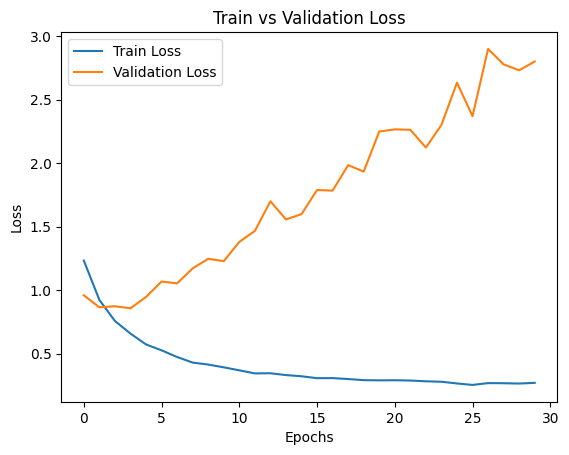

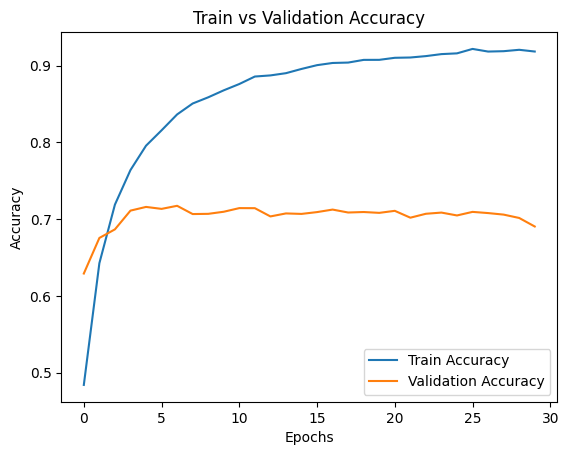

In [ ]:
import matplotlib.pyplot as plt

# 손실 그래프
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train vs Validation Loss')
plt.show()

# 정확도 그래프
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Train vs Validation Accuracy')
plt.show()

In [ ]:
# submission
sample_submission[['0','1','2','3','4']] = pred
sample_submission.to_csv(file_path + 'submission_pretrained.csv', index = False, encoding = 'utf-8')

public: 2.193796895  
private: 2.1561655323

#### 모델 6

- 초기값 설정

In [ ]:
# glorot 초기화
gl_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(24,activation='relu'),
    tf.keras.layers.Dense(5,activation='softmax')
])

In [ ]:
# uniform 초기화
un_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length, embeddings_initializer='uniform',
),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(24,activation='relu'),
    tf.keras.layers.Dense(5,activation='softmax')
])

In [ ]:
# he 초기화
he_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length, embeddings_initializer='he_normal',
),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(24,activation='relu'),
    tf.keras.layers.Dense(5,activation='softmax')
])

In [ ]:
# 정규분포 초기화
no_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length, embeddings_initializer='random_normal',
),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(24,activation='relu'),
    tf.keras.layers.Dense(5,activation='softmax')
])

In [ ]:
# compile model
gl_model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])
un_model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])
he_model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])
no_model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])
# model summary
print(gl_model.summary())
print(un_model.summary())
print(he_model.summary())
print(no_model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 16)           320000    
                                                                 
 global_average_pooling1d (  (None, 16)                0         
 GlobalAveragePooling1D)                                         
                                                                 
 dense (Dense)               (None, 24)                408       
                                                                 
 dense_1 (Dense)             (None, 5)                 125       
                                                                 
Total params: 320533 (1.22 MB)
Trainable params: 320533 (1.22 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
Model: "sequential_1"
___________________________________________________________

In [ ]:
# fit model
num_epochs =20
history_gl = gl_model.fit(train_padded, y_train, epochs=num_epochs,
                    verbose=2, validation_split=0.2)
history_le = un_model.fit(train_padded, y_train, epochs=num_epochs,
                    verbose=2, validation_split=0.2)
history_he = he_model.fit(train_padded, y_train, epochs=num_epochs,
                    verbose=2, validation_split=0.2)
history_no = no_model.fit(train_padded, y_train, epochs=num_epochs,
                    verbose=2, validation_split=0.2)

Epoch 1/20
1372/1372 - 12s - loss: 1.5415 - accuracy: 0.2903 - val_loss: 1.4593 - val_accuracy: 0.3616 - 12s/epoch - 9ms/step
Epoch 2/20
1372/1372 - 9s - loss: 1.3559 - accuracy: 0.4203 - val_loss: 1.2634 - val_accuracy: 0.4859 - 9s/epoch - 7ms/step
Epoch 3/20
1372/1372 - 10s - loss: 1.1833 - accuracy: 0.5106 - val_loss: 1.1547 - val_accuracy: 0.5290 - 10s/epoch - 7ms/step
Epoch 4/20
1372/1372 - 13s - loss: 1.0680 - accuracy: 0.5608 - val_loss: 1.0582 - val_accuracy: 0.5705 - 13s/epoch - 10ms/step
Epoch 5/20
1372/1372 - 10s - loss: 0.9835 - accuracy: 0.6008 - val_loss: 1.0047 - val_accuracy: 0.5954 - 10s/epoch - 7ms/step
Epoch 6/20
1372/1372 - 9s - loss: 0.9145 - accuracy: 0.6381 - val_loss: 0.9555 - val_accuracy: 0.6225 - 9s/epoch - 7ms/step
Epoch 7/20
1372/1372 - 10s - loss: 0.8588 - accuracy: 0.6634 - val_loss: 0.9219 - val_accuracy: 0.6420 - 10s/epoch - 7ms/step
Epoch 8/20
1372/1372 - 9s - loss: 0.8123 - accuracy: 0.6848 - val_loss: 0.9012 - val_accuracy: 0.6542 - 9s/epoch - 7ms/st

In [ ]:
# predict values
pred_gl = gl_model.predict(test_padded)
pred_un = un_model.predict(test_padded)
pred_he = he_model.predict(test_padded)
pred_no = no_model.predict(test_padded)

614/614 [==============================] - 1s 2ms/step


In [ ]:
# submission
sample_submission[['0','1','2','3','4']] = pred_gl
sample_submission.to_csv('submission_gl.csv', index = False, encoding = 'utf-8')
sample_submission[['0','1','2','3','4']] = pred_un
sample_submission.to_csv('submission_un.csv', index = False, encoding = 'utf-8')
sample_submission[['0','1','2','3','4']] = pred_he
sample_submission.to_csv('submission_he.csv', index = False, encoding = 'utf-8')
sample_submission[['0','1','2','3','4']] = pred_no
sample_submission.to_csv('submission_no.csv', index = False, encoding = 'utf-8')
# gl : 0.6603564702/0.6469339151 un : 0.5186804833/0.5010022438 he : 0.5568235857/0.5394965253 no : 0.5233272113/0.5116441932

#### 모델 7

- GLoVe word-embedding (Pre-trained)

In [ ]:
# 파라미터 설정
max_words = 20000
embedding_dim = 16
max_length = 500
tokenizer = Tokenizer(num_words = max_words)
tokenizer.fit_on_texts(X_train)
word_index = tokenizer.word_index
padding_type = 'post'

In [ ]:
# 데이터를 sequence로 변환해주고 padding
train_sequences = tokenizer.texts_to_sequences(X_train)
train_padded = pad_sequences(train_sequences, padding=padding_type, maxlen=max_length)

test_sequences = tokenizer.texts_to_sequences(X_test)
test_padded = pad_sequences(test_sequences, padding=padding_type, maxlen=max_length)

In [ ]:
# Parsing the GLoVe word_embeddings file

glove_dir = "/content/drive/MyDrive/glove.6B"

embeddings_index = {}
f = open(os.path.join(glove_dir, 'glove.6B.100d.txt'))
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs

f.close()

# Preparing the GloVe word-embeddings matrix

embedding_dim = 100

embedding_matrix = np.zeros((max_words, embedding_dim))
for word, i in word_index.items():
    if i < max_words:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

In [ ]:
# Model definition

from keras.models import Sequential
from keras.layers import Embedding, Flatten, Dense

model = Sequential()
model.add(Embedding(max_words, embedding_dim, input_length=max_length))
model.add(Flatten())
model.add(Dense(32, activation='relu'))
model.add(Dense(5, activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 100)          2000000   
                                                                 
 flatten (Flatten)           (None, 50000)             0         
                                                                 
 dense (Dense)               (None, 32)                1600032   
                                                                 
 dense_1 (Dense)             (None, 5)                 165       
                                                                 
Total params: 3600197 (13.73 MB)
Trainable params: 3600197 (13.73 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# Loading pretrained word embeddings into the Embedding Layer

model.layers[0].set_weights([embedding_matrix])
model.layers[0].trainable = False

In [ ]:
# Training and evaluation

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history = model.fit(train_padded, y_train, epochs=30, batch_size=32, validation_split=0.2)
model.save_weights('pre_trained_glove_model.h5')

Epoch 1/30
1372/1372 [==============================] - 44s 32ms/step - loss: 1.4800 - accuracy: 0.3410 - val_loss: 1.4015 - val_accuracy: 0.3930
Epoch 2/30
1372/1372 [==============================] - 39s 28ms/step - loss: 1.3381 - accuracy: 0.4328 - val_loss: 1.3473 - val_accuracy: 0.4267
Epoch 3/30
1372/1372 [==============================] - 39s 28ms/step - loss: 1.2371 - accuracy: 0.4829 - val_loss: 1.3535 - val_accuracy: 0.4292
Epoch 4/30
1372/1372 [==============================] - 38s 28ms/step - loss: 1.1531 - accuracy: 0.5265 - val_loss: 1.3558 - val_accuracy: 0.4431
Epoch 5/30
1372/1372 [==============================] - 41s 30ms/step - loss: 1.0825 - accuracy: 0.5595 - val_loss: 1.3713 - val_accuracy: 0.4592
Epoch 6/30
1372/1372 [==============================] - 38s 28ms/step - loss: 1.0168 - accuracy: 0.5908 - val_loss: 1.4018 - val_accuracy: 0.4596
Epoch 7/30
1372/1372 [==============================] - 42s 31ms/step - loss: 0.9611 - accuracy: 0.6187 - val_loss: 1.4587 -

In [ ]:
pred = model.predict(test_padded)

614/614 [==============================] - 4s 6ms/step


In [ ]:
# submission
sample_submission[['0','1','2','3','4']] = pred
sample_submission.to_csv('submission_pretrained.csv', index = False, encoding = 'utf-8')

# 결괏값 : 4.1343883997/4.2474503215